# OPTI 556 Computational Imaging
### Homework 1: Recreate figures from Chapter 2 - Forward Models
### YiYun Wu
### 5 September 2023

# Initialization Code

In [69]:
from __future__ import print_function
from ipywidgets import interact, interactive, fixed, interact_manual
from IPython.display import display, clear_output
import ipywidgets as widgets
import numpy as np
from skimage import io
import matplotlib as mpl
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d, InterpolatedUnivariateSpline
import scipy.integrate as integrate
import pywt
%matplotlib inline

# Fourier Representation of Signals
Let's start by defining an example function:

Text(0.5, 1.0, 'Example Function')

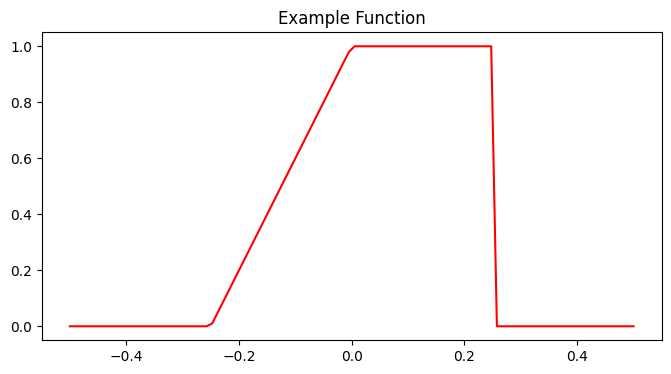

In [31]:
def f(x):
  if x<-.25:
    f=0.
  elif x<0:
    f=4.*(x+.25)
  elif x<.25:
    f=1.
  else:
    f=0.
  return f

from numpy import vectorize
vf = vectorize(f)
plt.figure(figsize=(8, 4))
plt.plot(np.linspace(-.5,.5,100),vf(np.linspace(-.5,.5,100)),'r')
plt.title("Example Function")

*Figure 2.3: Example function f(x) for illustration of Fourier series representation*

Approximate it with fourier series:

<ipython-input-33-c2acd4b74008>:17: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(2, 2, pt)


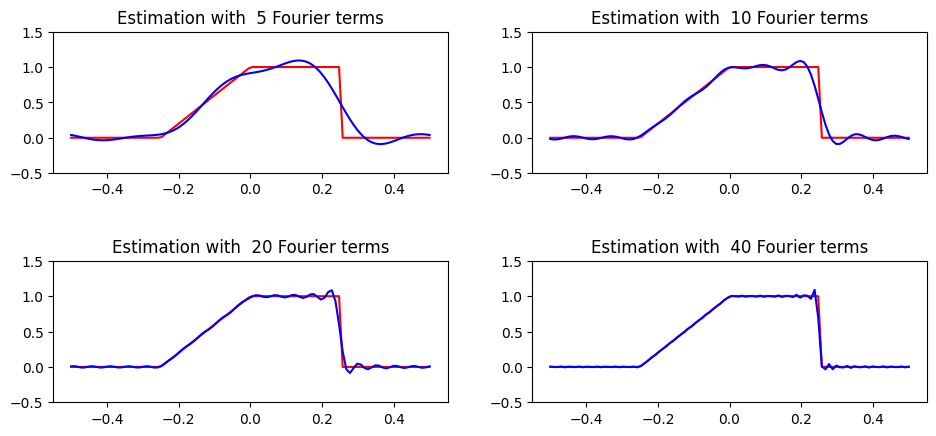

In [33]:
pt=0;
plt.subplots(figsize=(10,5))
xrange=np.linspace(-.5,.5,100);
for coeffs in [5, 10, 20, 40]:
  pt=pt+1
  sv=np.zeros(coeffs)
  cv=np.zeros(coeffs)
  for pop in np.arange(coeffs):
    sv[pop]=2*integrate.quad(lambda x: vf(x)*np.sin(2*np.pi*pop*x), -.5, .5)[0]
    cv[pop]=2*integrate.quad(lambda x: vf(x)*np.cos(2*np.pi*pop*x), -.5, .5)[0]
    cv[0]=cv[0]
    def px(x,sv,cv):
      pxx=0;
      for pop in np.arange(len(sv)):
        pxx=pxx+sv[pop]*np.sin(2*np.pi*pop*x)+cv[pop]*np.cos(2*np.pi*pop*x)
      return pxx
  plt.subplot(2, 2, pt)
  plt.plot(xrange,vf(xrange),'r',xrange,px(xrange,sv,cv)-cv[0]/2.,'b')
  plt.ylim(-.5, 1.5)
  plt.title("Estimation with  %i Fourier terms" %(pop+1))
  plt.tight_layout(pad=3)
  plt.savefig('exampleFSexpansion.png')

*Figure 2.4: Fourier series presentation of the function of Fig. 2.3 for various ranges of [-n,n]*

Repeating this Fourier Representation with my own signal functions.

<ipython-input-81-227a8c0fcba7>:34: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(2, 2, pt)


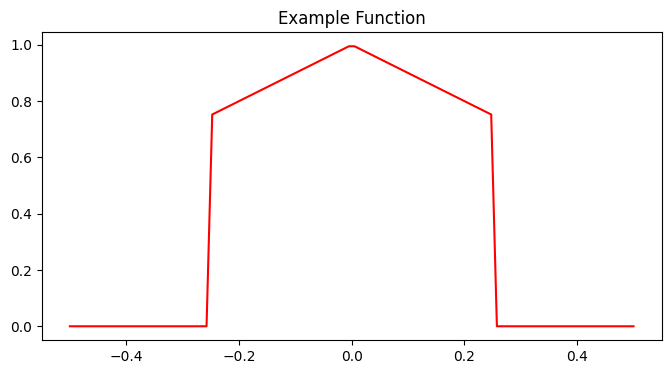

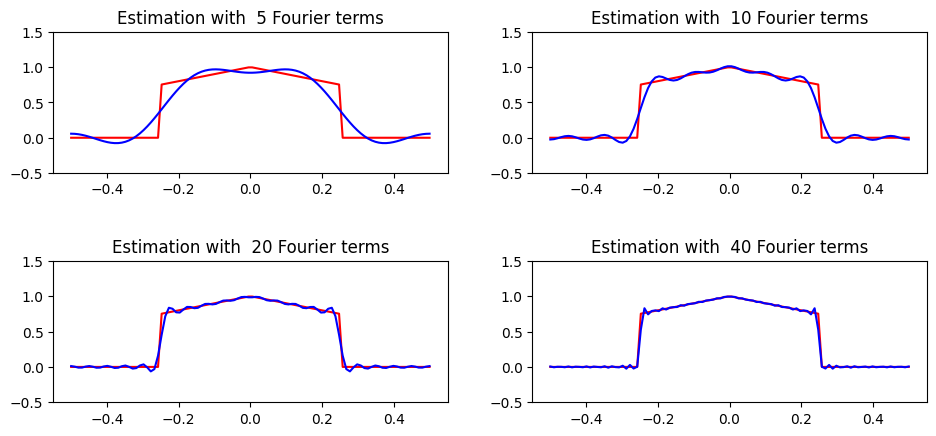

In [81]:
def g(x):
  if x<-.25:
    g=0.
  elif x<0:
    g=(x+1)
  elif x<.25:
    g=(-x+1)
  else:
    g=0.
  return g

from numpy import vectorize
vf = vectorize(g)
plt.figure(figsize=(8, 4))
plt.plot(np.linspace(-.5,.5,100),vf(np.linspace(-.5,.5,100)),'r')
plt.title("Example Function")

pt=0;
plt.subplots(figsize=(10,5))
xrange=np.linspace(-.5,.5,100);
for coeffs in [5, 10, 20, 40]:
  pt=pt+1
  sv=np.zeros(coeffs)
  cv=np.zeros(coeffs)
  for pop in np.arange(coeffs):
    sv[pop]=2*integrate.quad(lambda x: vf(x)*np.sin(2*np.pi*pop*x), -.5, .5)[0]
    cv[pop]=2*integrate.quad(lambda x: vf(x)*np.cos(2*np.pi*pop*x), -.5, .5)[0]
    cv[0]=cv[0]
    def px(x,sv,cv):
      pxx=0;
      for pop in np.arange(len(sv)):
        pxx=pxx+sv[pop]*np.sin(2*np.pi*pop*x)+cv[pop]*np.cos(2*np.pi*pop*x)
      return pxx
  plt.subplot(2, 2, pt)
  plt.plot(xrange,vf(xrange),'r',xrange,px(xrange,sv,cv)-cv[0]/2.,'b')
  plt.ylim(-.5, 1.5)
  plt.title("Estimation with  %i Fourier terms" %(pop+1))
  plt.tight_layout(pad=3)
  plt.savefig('exampleFSexpansion.png')

*Figure 2.4.1: Recreation of own signal 1*

<ipython-input-82-335a1164882a>:34: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(2, 2, pt)
<ipython-input-82-335a1164882a>:27: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  cv[pop]=2*integrate.quad(lambda x: vf(x)*np.cos(2*np.pi*pop*x), -.5, .5)[0]
<ipython-input-82-335a1164882a>:26: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the in

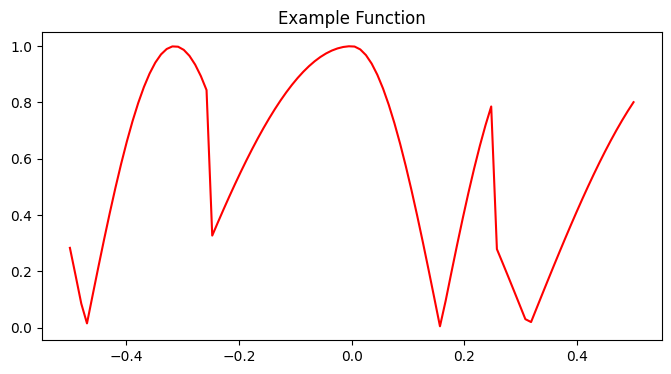

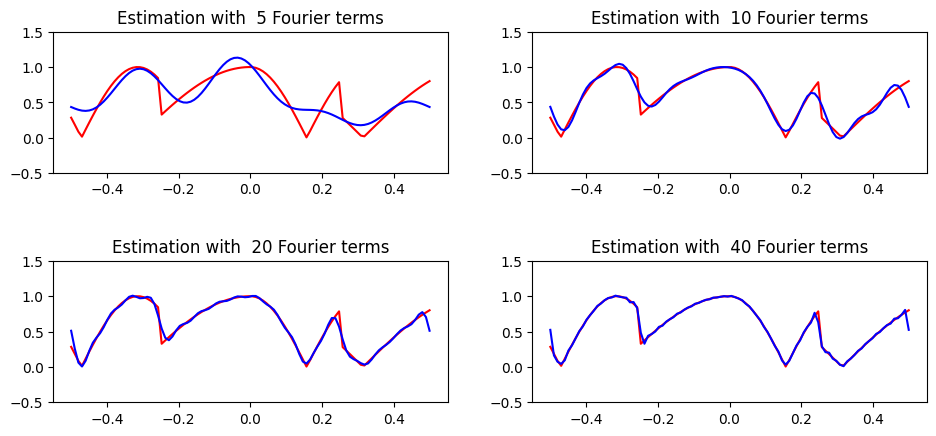

In [82]:
def h(x):
  if x<-.25:
    h= np.absolute(np.cos(10*x))
  elif x<0:
    h= np.absolute(np.cos(5*x))
  elif x<.25:
    h= np.absolute(np.cos(10*x))
  else:
    h= np.absolute(np.cos(5*x))
  return h

from numpy import vectorize
vf = vectorize(h)
plt.figure(figsize=(8, 4))
plt.plot(np.linspace(-.5,.5,100),vf(np.linspace(-.5,.5,100)),'r')
plt.title("Example Function")

pt=0;
plt.subplots(figsize=(10,5))
xrange=np.linspace(-.5,.5,100);
for coeffs in [5, 10, 20, 40]:
  pt=pt+1
  sv=np.zeros(coeffs)
  cv=np.zeros(coeffs)
  for pop in np.arange(coeffs):
    sv[pop]=2*integrate.quad(lambda x: vf(x)*np.sin(2*np.pi*pop*x), -.5, .5)[0]
    cv[pop]=2*integrate.quad(lambda x: vf(x)*np.cos(2*np.pi*pop*x), -.5, .5)[0]
    cv[0]=cv[0]
    def px(x,sv,cv):
      pxx=0;
      for pop in np.arange(len(sv)):
        pxx=pxx+sv[pop]*np.sin(2*np.pi*pop*x)+cv[pop]*np.cos(2*np.pi*pop*x)
      return pxx
  plt.subplot(2, 2, pt)
  plt.plot(xrange,vf(xrange),'r',xrange,px(xrange,sv,cv)-cv[0]/2.,'b')
  plt.ylim(-.5, 1.5)
  plt.title("Estimation with  %i Fourier terms" %(pop+1))
  plt.tight_layout(pad=3)
  plt.savefig('exampleFSexpansion.png')

*Figure 2.4.2: Recreation of own signal 2*

<ipython-input-86-9966694daef8>:34: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(2, 2, pt)


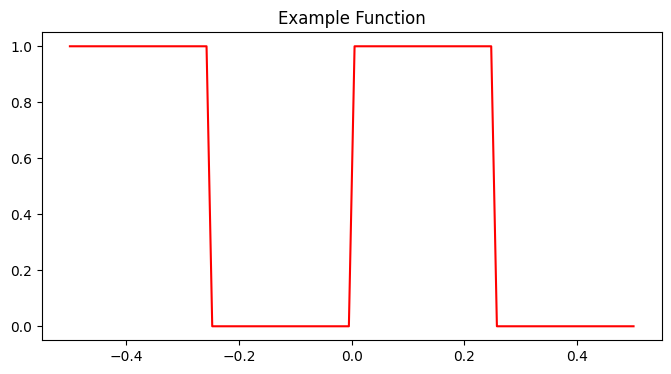

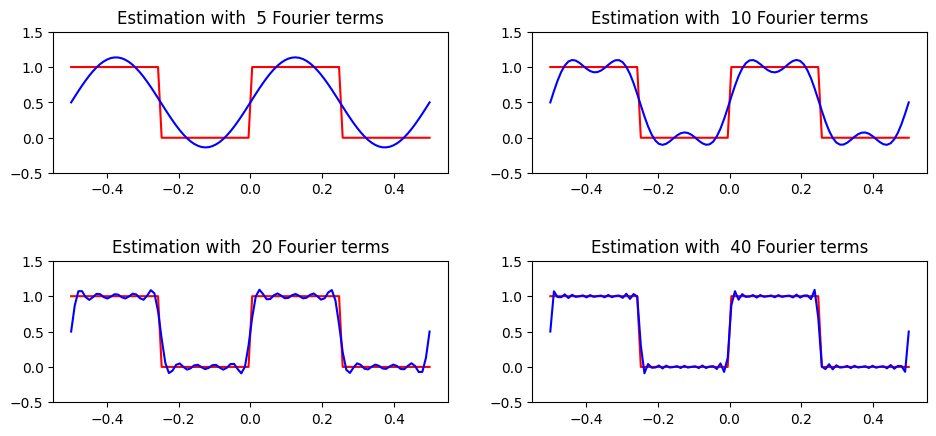

In [86]:
def i(x):
  if x<-.25:
    i= 1
  elif x<0:
    i= 0
  elif x<.25:
    i= 1
  else:
    i= 0
  return i

from numpy import vectorize
vf = vectorize(i)
plt.figure(figsize=(8, 4))
plt.plot(np.linspace(-.5,.5,100),vf(np.linspace(-.5,.5,100)),'r')
plt.title("Example Function")

pt=0;
plt.subplots(figsize=(10,5))
xrange=np.linspace(-.5,.5,100);
for coeffs in [5, 10, 20, 40]:
  pt=pt+1
  sv=np.zeros(coeffs)
  cv=np.zeros(coeffs)
  for pop in np.arange(coeffs):
    sv[pop]=2*integrate.quad(lambda x: vf(x)*np.sin(2*np.pi*pop*x), -.5, .5)[0]
    cv[pop]=2*integrate.quad(lambda x: vf(x)*np.cos(2*np.pi*pop*x), -.5, .5)[0]
    cv[0]=cv[0]
    def px(x,sv,cv):
      pxx=0;
      for pop in np.arange(len(sv)):
        pxx=pxx+sv[pop]*np.sin(2*np.pi*pop*x)+cv[pop]*np.cos(2*np.pi*pop*x)
      return pxx
  plt.subplot(2, 2, pt)
  plt.plot(xrange,vf(xrange),'r',xrange,px(xrange,sv,cv)-cv[0]/2.,'b')
  plt.ylim(-.5, 1.5)
  plt.title("Estimation with  %i Fourier terms" %(pop+1))
  plt.tight_layout(pad=3)
  plt.savefig('exampleFSexpansion.png')

*Figure 2.4.3: Recreation of own signal 3*

<ipython-input-97-892f98e397de>:34: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(2, 2, pt)


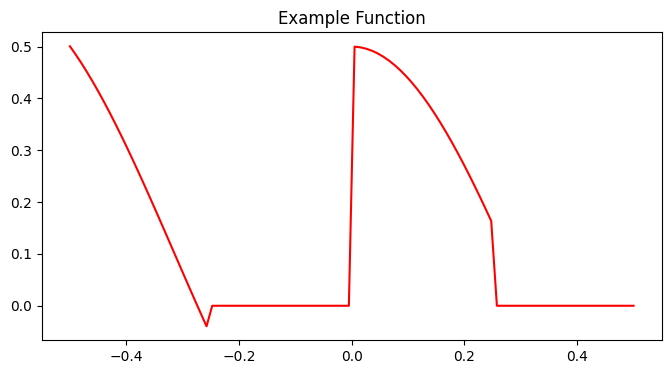

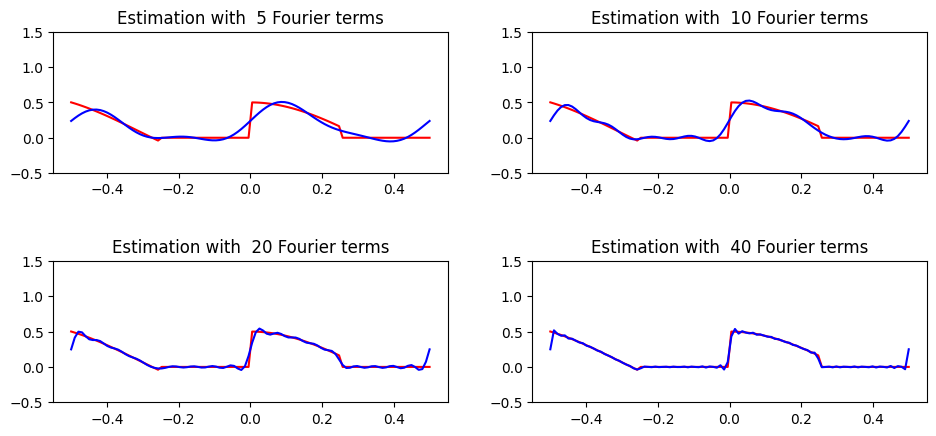

In [97]:
def j(x):
  if x<-.25:
    j= -0.5*np.cos(x*5)+.1
  elif x<0:
    j= 0
  elif x<.25:
    j= 0.5*np.cos(-x*5)
  else:
    j= 0
  return j

from numpy import vectorize
vf = vectorize(j)
plt.figure(figsize=(8, 4))
plt.plot(np.linspace(-.5,.5,100),vf(np.linspace(-.5,.5,100)),'r')
plt.title("Example Function")

pt=0;
plt.subplots(figsize=(10,5))
xrange=np.linspace(-.5,.5,100);
for coeffs in [5, 10, 20, 40]:
  pt=pt+1
  sv=np.zeros(coeffs)
  cv=np.zeros(coeffs)
  for pop in np.arange(coeffs):
    sv[pop]=2*integrate.quad(lambda x: vf(x)*np.sin(2*np.pi*pop*x), -.5, .5)[0]
    cv[pop]=2*integrate.quad(lambda x: vf(x)*np.cos(2*np.pi*pop*x), -.5, .5)[0]
    cv[0]=cv[0]
    def px(x,sv,cv):
      pxx=0;
      for pop in np.arange(len(sv)):
        pxx=pxx+sv[pop]*np.sin(2*np.pi*pop*x)+cv[pop]*np.cos(2*np.pi*pop*x)
      return pxx
  plt.subplot(2, 2, pt)
  plt.plot(xrange,vf(xrange),'r',xrange,px(xrange,sv,cv)-cv[0]/2.,'b')
  plt.ylim(-.5, 1.5)
  plt.title("Estimation with  %i Fourier terms" %(pop+1))
  plt.tight_layout(pad=3)
  plt.savefig('exampleFSexpansion.png')

*Figure 2.4.4: Recreation of own signal 4*

For my signal 3, which was a square wave function, I did see the Gibbs phenomena with fourier representation at the cliff edges of the wave. For all 4 signals, we are able to represent the custom waveform well within 40 Fourier terms.

# Gaussian Blur
Here we plot Gaussian distributions of various standard deviations, and their corresponding fourier transform, or "Gaussian filters." The narrower the point spread function, or the smaller the spread is in the spatial domain, the broader the corresponding function in the frequency domain.

<ipython-input-34-80b7260366be>:13: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1,2,1)


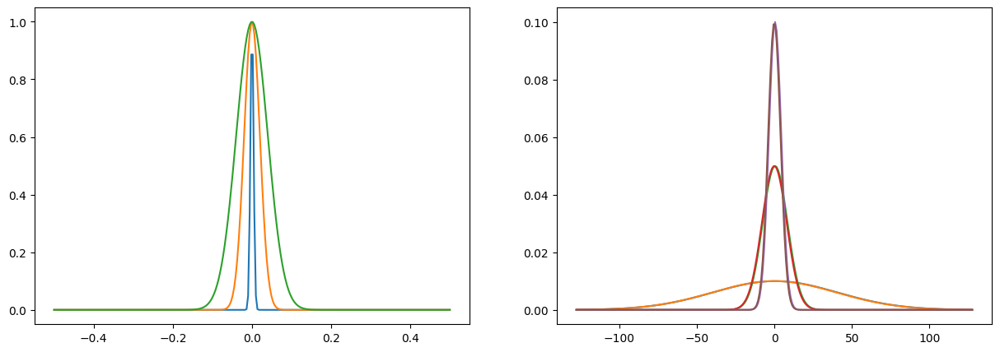

In [34]:
def h(x,sigma):
  hx=np.exp(-np.pi*(x/sigma)**2)
  return hx
def hu(u,sigma):
  hu=sigma*np.exp(-np.pi*(sigma*u)**2)
  return hu

xm=.5
Nn=256
xr=np.linspace(-xm,xm,Nn)
plt.subplots(figsize=(15,5))
for sig in[.01,.05,.1]:
  plt.subplot(1,2,1)
  plt.plot(xr,h(xr,sig))
dx=xr[2]-xr[1]
ur=np.linspace(-1/(2*dx),1/(2*dx),Nn)
for sig in [0.01,0.05,.1]:
  plt.subplot(1,2,2)
  plt.plot(ur,np.abs(np.fft.fftshift(np.fft.fft(h(xr,sig))))*dx,ur,hu(ur,sig))
plt.savefig('gaussianFilters.png')

*Figure 2.5: Gaussian distributions of various $\sigma$ = [0.01, 0.05, 0.1 and 0.5] (left) and the corresponding Gaussian filters (right)*

Here we make several copies of the previous custom function and perform take the fourier transform.

<ipython-input-35-6326d6942965>:20: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1,2,1)


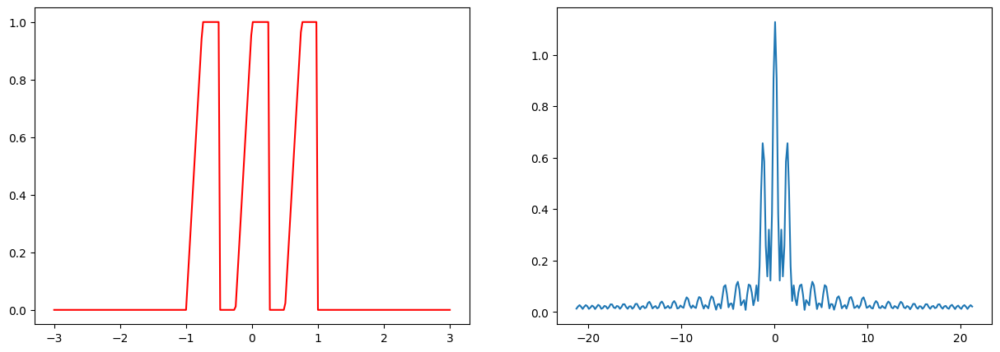

In [35]:
def f(x):
  if x<-.25:
    f=0.
  elif x<0:
    f=4.*(x+.25)
  elif x<.25:
    f=1.
  else:
    f=0.
  return f
def fs(x):
  fp=f(x-.75)+f(x)+f(x+.75)
  return fp
from numpy import vectorize
vf = vectorize(fs)
xm=3
Nn=256
xr=np.linspace(-xm,xm,Nn)
plt.subplots(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(xr,vf(xr),'r')
#plt.title("Example Function")
dx=xr[2]-xr[1]
ur=np.linspace(-1/(2*dx),1/(2*dx),Nn)
ftI=np.fft.fft(vf(xr))*dx
plt.subplot(1,2,2)
plt.plot(ur,np.abs(np.fft.fftshift(ftI)))
plt.savefig('examplePeaks.png')

*Figure 2.6: An example signal (left) formed by repeating the function of Fig. 2.3 and its Fourier transform (right)*

Next, we blur the example signal using Gaussian impuse response functions of various standard deviation. You can see the period signal start to get more and more distorted and meld together as the standard deviation of the Gaussian impulse increases.




<ipython-input-37-c0a00aaecefa>:6: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(2,2,ct)


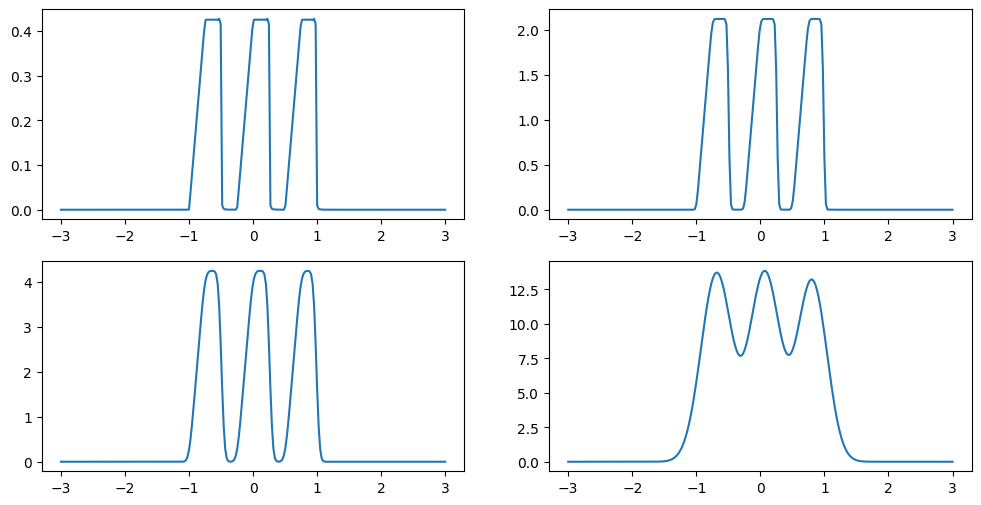

In [37]:
ct=1
plt.subplots(figsize=(12,6))
for blur in [0.01,0.05,.1, .5]:
  filteredFunction=np.fft.fftshift(ftI)*hu(ur,blur)
  ftIi=np.fft.ifft(np.fft.fftshift(filteredFunction))/dx**2
  plt.subplot(2,2,ct)
  plt.plot(xr,np.abs(ftIi))
  ct=ct+1
plt.savefig('gaussianBlur.png')

*Figure 2.7: The signal of Fig. 2.6 blurred by the Gaussian impulse response for $\sigma$ = [0.01, 0.05, 0.1, and 0.5]*

With the advent of camera phones, we are often taking pictures with detectors made up of rectangular pixels, so we are often producing rect functions in the spatial domain, which translates to a sinc function in the frequency domain. This means by taking a picture, we are applying a low pass filter, while higher frequencies oscillate on either side to 0.

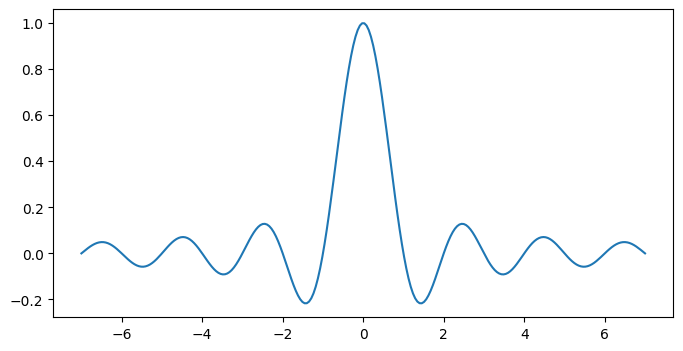

In [41]:
xm=7
Nn=256
xr=np.linspace(-xm,xm,Nn)
plt.figure(figsize=(8, 4))
plt.plot(xr,np.sinc(xr))

*Figure 2.8: sinc(x)*

# Sampling
Next we demonstrate the effect sampling has on the recreation of a signal. Given a Gaussian function with a cosine envelope, or a harmonic Gaussian function:

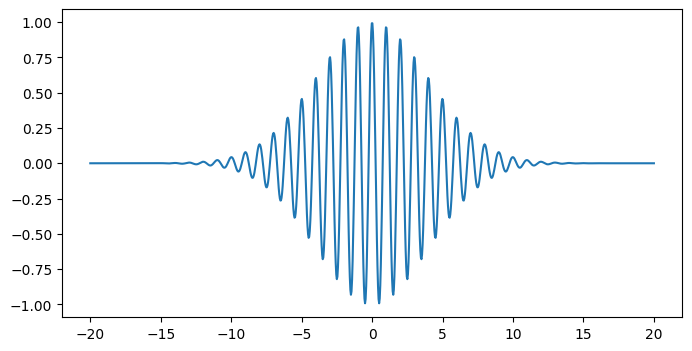

In [132]:
xrange=np.linspace(-20,20,1000)
def fx(x):
  fxx=np.exp(-0.01*np.pi*x**2)
  fxx=fxx*np.cos(2*np.pi*x)
  return fxx
plt.figure(figsize=(8, 4))
plt.plot(xrange,fx(xrange))

*Figure 2.9: Example function $f(x) = exp(-0.01\pi x^2)cos(2\pi x)$*

Recall from Euler's formula that the fourier transform of cosine gives us 2 frequencies.
$$cos(\theta) = \frac{e^{i\theta}+e^{-i\theta}}{2}$$

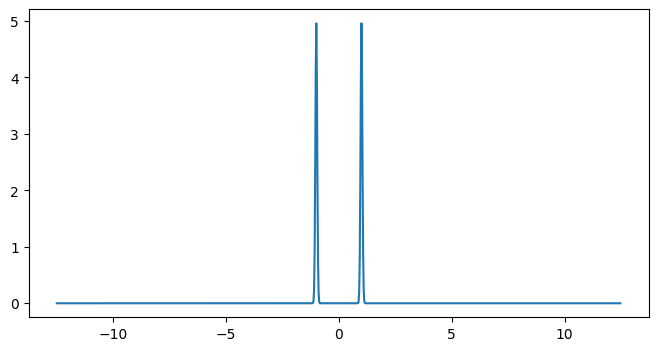

In [133]:
urange=np.arange(-500./40.,500./40.,1./40.)
plt.figure(figsize=(8, 4))
plt.plot(urange,(1./(urange[-1]-urange[0]))*np.real(np.fft.fftshift(np.fft.fft(np.fft.fftshift(fx(xrange))))))

*Figure 2.10: Fourier transformation of the harmonic Gaussian function*

Suppose we sample the harmonic Gaussian function above Nyquist, so we should be able to recreate the original function.  
We set the sampling date $δx$ to 0.4, corresponding to a bandwidth B of 1.5.

(-10.0, 10.0)

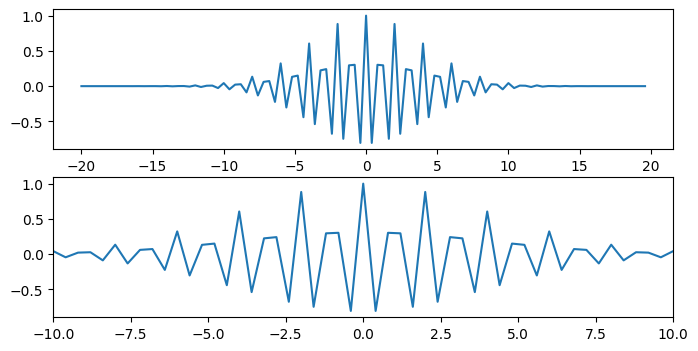

In [134]:
srange=np.arange(-20,20,.4)
plt.figure(figsize=(8, 4))
plt.subplot(2,1,1)
plt.plot(srange,fx(srange))
plt.subplot(2,1,2)
plt.plot(srange,fx(srange))
plt.xlim(-10,10)

*Figure 2.11: Samples drawn from f(x) with sampling period 0.4. The lower plot is the detail of the upper plot over the central region.*

You can see in Fig 2.11 that due to sampling, we are not getting the rounded curves from the original function. This can be fixed using a technique called interpolation, where we replace each sample by a sinc function centered on the corresponding sampling point.

(-5.0, 5.0)

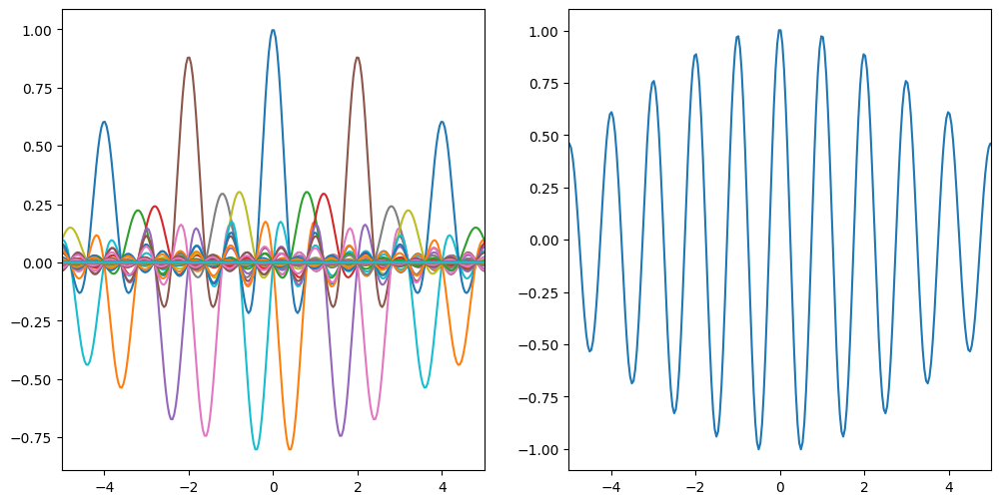

In [135]:
usrange=srange/(.4*40.)
interP=np.zeros(1000)
plt.figure(figsize=(12, 6))
for pip in np.arange(len(srange)):
  plt.subplot(1,2,1)
  plt.plot(xrange,fx(srange[pip])*np.sinc((usrange[-1]-usrange[0])*(xrange-srange[pip])))
  interP=interP+fx(srange[pip])*np.sinc((usrange[-1]-usrange[0])*(xrange-srange[pip]))
plt.xlim(-5,5)
plt.subplot(1,2,2)
plt.plot(xrange,interP)
plt.xlim(-5,5)

*Figure 2.12: Here the upsampling factor is 10, meaning that the sinc is evaluated at 9 new values at each point between sampling points. The curves at left show the signal values for the sinc's corresponding to each sample point. Summing all of the curves at left at each point yields the interpolated signal shown on the right.*

Plotting the interpolated signal, we get something close to the original function:

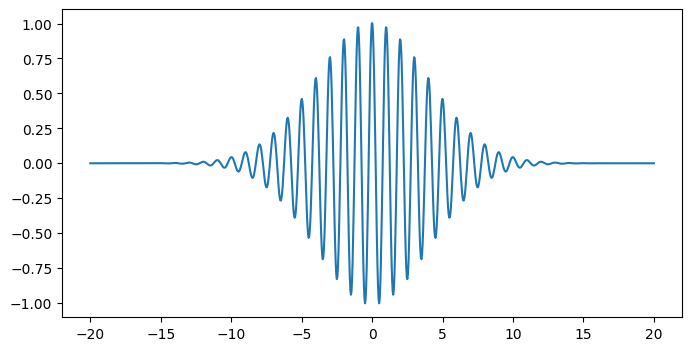

In [136]:
plt.figure(figsize=(8, 4))
plt.plot(xrange,interP)

*Figure 2.12.1: Gaussian harmonic function recreated using sampling and Shannon interpolation.*


Let's see what happens if we interpolate using cubic interpolators instead:

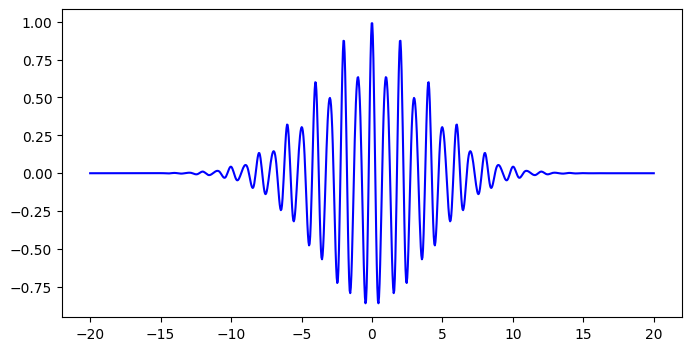

In [137]:
from scipy.interpolate import CubicSpline
f = CubicSpline(srange, fx(srange), bc_type='natural')
x_new = np.linspace(-20, 20, 1000)
y_new = f(x_new)
plt.figure(figsize=(8, 4))
plt.plot(x_new, y_new, 'b')

*Figure 2.12.2: Gaussian harmonic function recreated using cubic interpolation.*

We see that for our harmonic Gaussian function, the interpolated signal is not recreated as well as using sinc interpolators.  
How about using linear interpolators?

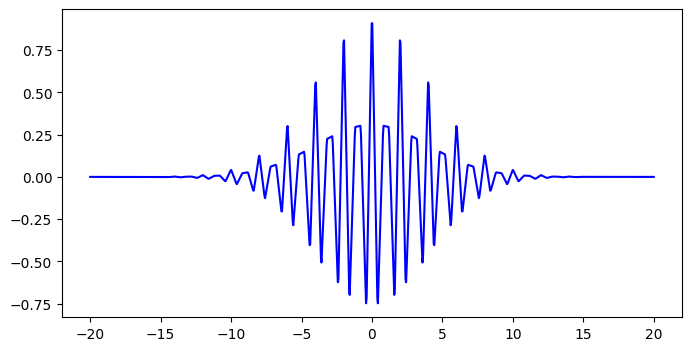

In [138]:
x_new = np.linspace(-20, 20, 1000)
f = np.interp(x_new, srange, fx(srange))
plt.figure(figsize=(8, 4))
plt.plot(x_new, f, 'b')

*Figure 2.12.3: Gaussian harmonic function recreated using linear interpolation.*

Again, we don't get as good a recreation using linear interpolators compared to sinc interpolators.  
What happens if we sample below the Nyquist frequency, or undersample?

<ipython-input-139-ff32cec7bbce>:6: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  fftP[(np.int(len(fftP)/2)-np.int(len(srange)/2)):(np.int(len(fftP)/2)-np.int(len(srange)/2)+len(srange))]=(1./(usrange[-1]-usrange[0]))*np.fft.fftshift(np.fft.fft(np.fft.fftshift(fx(srange))));
<ipython-input-139-ff32cec7bbce>:6: ComplexWarning: Casting complex values to real discards the imaginary part
  fftP[(np.int(len(fftP)/2)-np.int(len(srange)/2)):(np.int(len(fftP)/2)-np.int(len(srange)/2)+len(srange))]=(1./(usrange[-1]-usrange[0]))*np.fft.fftshift(np.fft.fft(

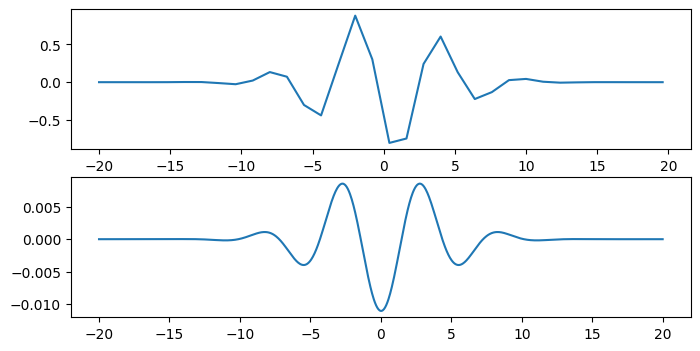

In [139]:
srange=np.arange(-20,20,1.2)
plt.figure(figsize=(8, 4))
plt.subplot(2,1,1)
plt.plot(srange,fx(srange))
fftP=0.*urange;
fftP[(np.int(len(fftP)/2)-np.int(len(srange)/2)):(np.int(len(fftP)/2)-np.int(len(srange)/2)+len(srange))]=(1./(usrange[-1]-usrange[0]))*np.fft.fftshift(np.fft.fft(np.fft.fftshift(fx(srange))));
plt.subplot(2,1,2)
plt.plot(xrange,np.real(np.fft.fftshift(np.fft.ifft(np.fft.fftshift(fftP)))))

*Figure 2.13: The upper curve shows samples of $f(x)$ drawn with period 1.2, corresponding to B = 0.42. The bottom curve is the interpolated signal.*

# Wavelets
Next, we look at creative ways we can decompose a signal. A commonly used example is the Haar basis, which consists of rectangular wavelets. Using these wavelets, we can convey new information about a signal with efficiency. In other words, with each successive Haar level, we can use the Haar basis to capture only the non-redundant information in between previously captured points.

Text(0.5, 1.0, '$\\psi_{-1,0}(x)$')

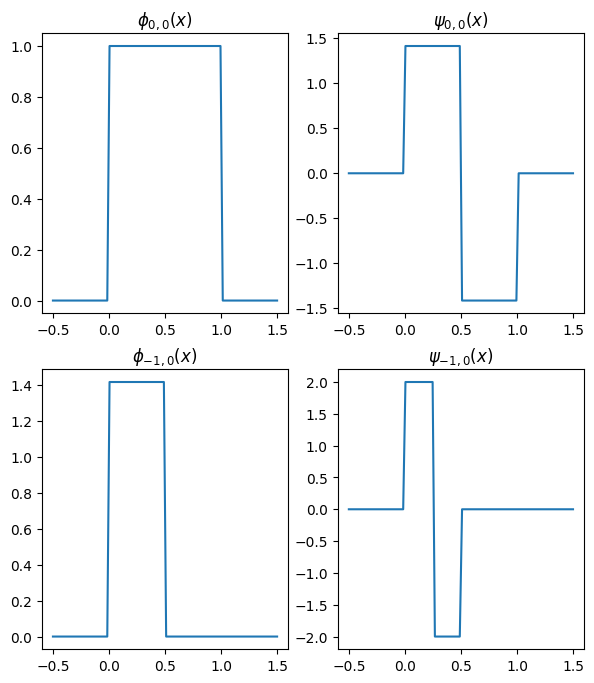

In [55]:
def betab(x):
  b=(1.-np.sign(np.abs(x-.5)-.5))/2.
  return b
beta=np.vectorize(betab)
def phi(j,n,x):
  phib=beta(x/(2.**j)-n)/np.sqrt(2**j)
  return phib
def psi(j,n,x):
  psib=phi(j-1,n,x)-phi(j-1,n+1,x)
  return psib

xp=np.linspace(-.5,1.5,100)
plt.figure(figsize=(7, 8))
plt.subplot(2,2,1)
plt.plot(xp,phi(0,0,xp))
plt.title("$\phi_{0,0}(x)$")
plt.subplot(2,2,2)
plt.plot(xp,psi(0,0,xp))
plt.title("$\psi_{0,0}(x)$")
plt.subplot(2,2,3)
plt.plot(xp,phi(-1,0,xp))
plt.title("$\phi_{-1,0}(x)$")
plt.subplot(2,2,4)
plt.plot(xp,psi(-1,0,xp))
plt.title("$\psi_{-1,0}(x)$")

*Figure 2.15: Order 0 and -1 scaling and wavelet functions for the Haar basis*

<ipython-input-58-56b214a77733>:11: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  haarCoeff=np.zeros(np.int(2.*xsize*(2**level)))
<ipython-input-58-56b214a77733>:13: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  haarCoeff[

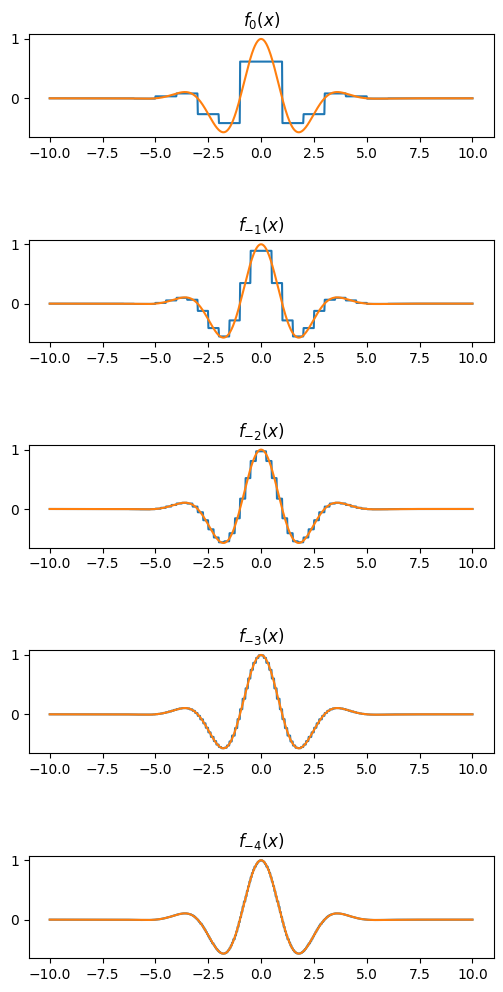

In [58]:
xsize=10;
xrange=np.linspace(-xsize,xsize,1000)
def fx(x):
  fxx=np.exp(-0.05*np.pi*x**2)
  fxx=fxx*np.cos(2*np.pi*x/4.)
  return fxx
gx=np.vectorize(fx)
plt.figure(figsize=(6, 12))
def fxHaar(levels=3):
  for level in np.arange(levels):
    haarCoeff=np.zeros(np.int(2.*xsize*(2**level)))
    for pop in np.arange(len(haarCoeff)):
      haarCoeff[pop]=(2.**level)*integrate.quad(gx,np.float((pop)*(1./(2.**level))-xsize),np.float((pop+1)*(1./(2.**level))-xsize))[0]
    def fp(x):
      fpp=haarCoeff[np.mod(np.int(np.floor((x+xsize)*(2**level))),len(haarCoeff))]
      return fpp
    gp=np.vectorize(fp)
    plt.subplot(levels,1,level+1)
    plt.subplots_adjust(hspace=1)
    plt.plot(xrange,gp(xrange),xrange,gx(xrange))
    plt.title('$f_{%d}(x)$' % -level)
fxHaar(5)

*Figure 2.14: Projection of the example function $f(x) = e^{-0.05\pi x^2} cos(\frac{\pi x}{2})$ for Haar levels 0 through -4*

Given an example image:

--2023-09-06 05:27:51--  https://user-images.githubusercontent.com/98360062/265897288-9ed52021-1f47-4598-ab3e-7db67f64f89e.jpeg
Resolving user-images.githubusercontent.com (user-images.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to user-images.githubusercontent.com (user-images.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3467316 (3.3M) [image/jpeg]
Saving to: ‘265897288-9ed52021-1f47-4598-ab3e-7db67f64f89e.jpeg.5’

265897288-9ed52021- 100%[===================>]   3.31M  14.4MB/s    in 0.2s    

2023-09-06 05:27:51 (14.4 MB/s) - ‘265897288-9ed52021-1f47-4598-ab3e-7db67f64f89e.jpeg.5’ saved [3467316/3467316]



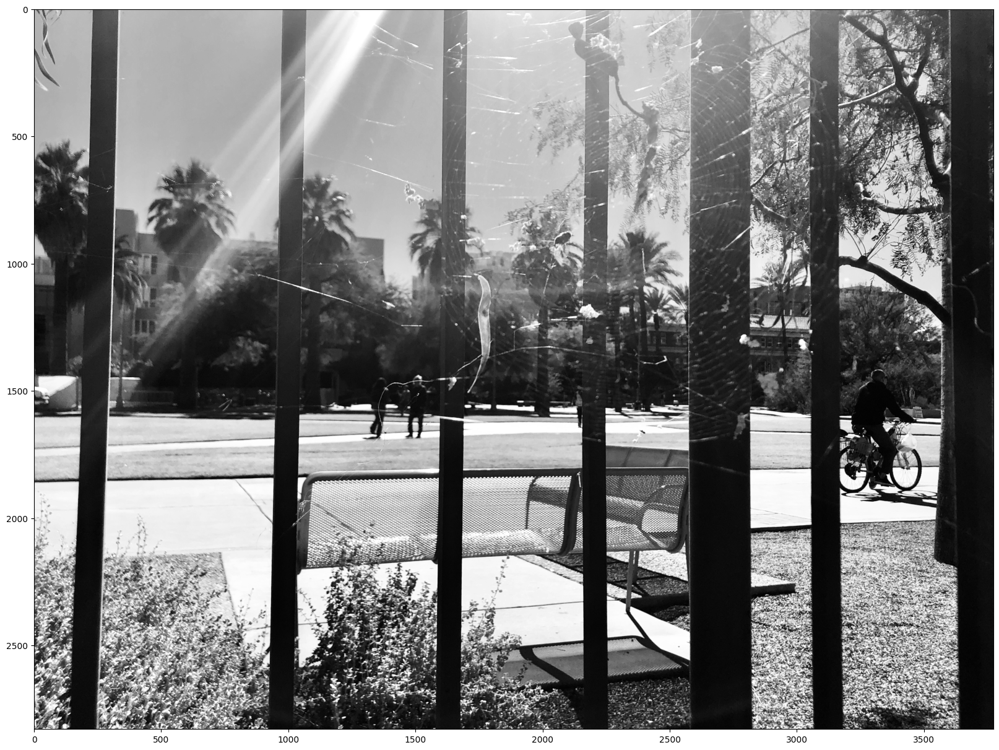

In [199]:
!wget https://user-images.githubusercontent.com/98360062/265897288-9ed52021-1f47-4598-ab3e-7db67f64f89e.jpeg
pop=io.imread('265897288-9ed52021-1f47-4598-ab3e-7db67f64f89e.jpeg',as_gray=True)
np.shape(pop)
plt.imshow(pop,cmap=plt.cm.gray)

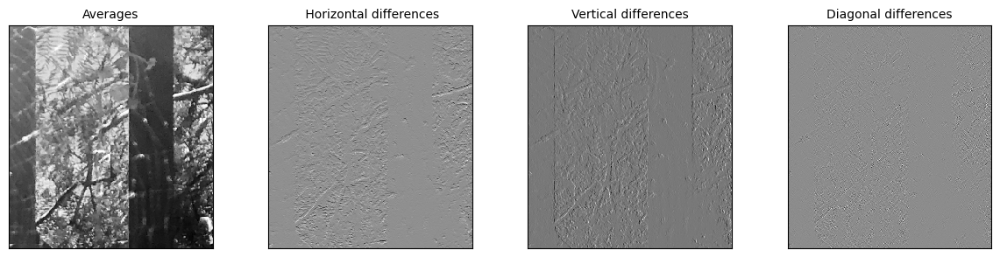

In [200]:
titles = ['Averages', ' Horizontal differences',
          'Vertical differences', 'Diagonal differences']
coeffs2 = pywt.dwt2(pop[200:762,2750:3262], 'haar')
LL, (LH, HL, HH) = coeffs2
fig = plt.figure(figsize=(12, 3))
for i, a in enumerate([LL, LH, HL, HH]):
    ax = fig.add_subplot(1, 4, i + 1)
    ax.imshow(a, interpolation="nearest", cmap=plt.cm.gray)
    ax.set_title(titles[i], fontsize=10)
    ax.set_xticks([])
    ax.set_yticks([])
fig.tight_layout()
fig.show()

*Figure 2.16: Averages and differences for the discrete 2D wavelet transform of a 512x512 pixel image. Each of the transform subimages is 256x256*

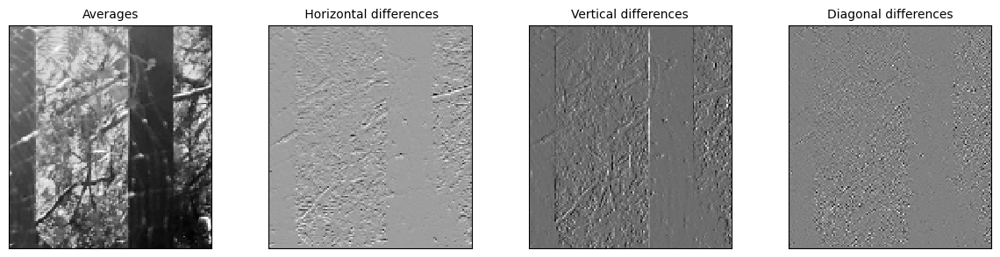

In [201]:
titles = ['Averages', ' Horizontal differences',
          'Vertical differences', 'Diagonal differences']
coeffs2 = pywt.dwt2(LL, 'haar')
LL, (LH, HL, HH) = coeffs2
fig = plt.figure(figsize=(12, 3))
for i, a in enumerate([LL, LH, HL, HH]):
    ax = fig.add_subplot(1, 4, i + 1)
    ax.imshow(a, interpolation="nearest", cmap=plt.cm.gray)
    ax.set_title(titles[i], fontsize=10)
    ax.set_xticks([])
    ax.set_yticks([])
fig.tight_layout()
fig.show()

*Figure 2.17: Discrete wavelet transform of the 256x256 average image from Fig. 2.16. Each of the transform components is 128x128*

What happens if we rotate the original image?

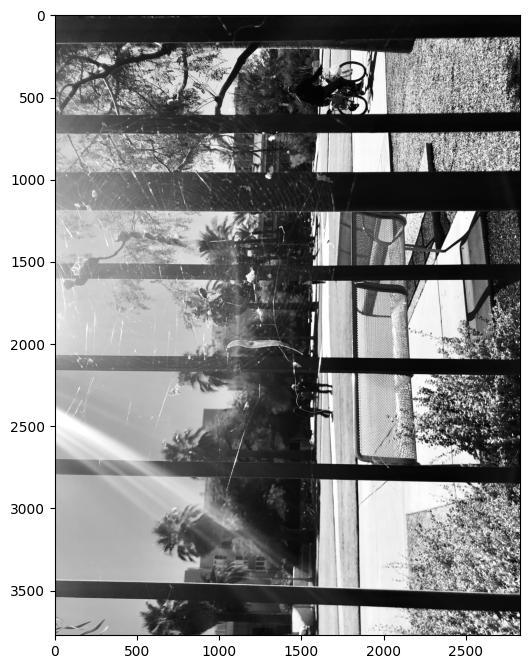

In [229]:
from skimage import data
from skimage.transform import rotate
rot = rotate(pop, 90, resize=True, preserve_range=True)
plt.figure(figsize=(6, 12))
plt.imshow(rot,cmap=plt.cm.gray)

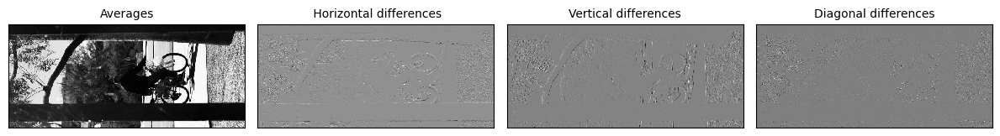

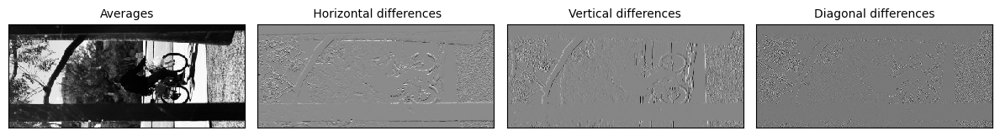

In [203]:
titles = ['Averages', ' Horizontal differences',
          'Vertical differences', 'Diagonal differences']
coeffs2 = pywt.dwt2(rot[100:760,750:2262], 'haar')
LL, (LH, HL, HH) = coeffs2
fig = plt.figure(figsize=(12, 3))
for i, a in enumerate([LL, LH, HL, HH]):
    ax = fig.add_subplot(1, 4, i + 1)
    ax.imshow(a, interpolation="nearest", cmap=plt.cm.gray)
    ax.set_title(titles[i], fontsize=10)
    ax.set_xticks([])
    ax.set_yticks([])
fig.tight_layout()
fig.show()

titles = ['Averages', ' Horizontal differences',
          'Vertical differences', 'Diagonal differences']
coeffs2 = pywt.dwt2(LL, 'haar')
LL, (LH, HL, HH) = coeffs2
fig = plt.figure(figsize=(12, 3))
for i, a in enumerate([LL, LH, HL, HH]):
    ax = fig.add_subplot(1, 4, i + 1)
    ax.imshow(a, interpolation="nearest", cmap=plt.cm.gray)
    ax.set_title(titles[i], fontsize=10)
    ax.set_xticks([])
    ax.set_yticks([])
fig.tight_layout()
fig.show()

Rotation does not affect the wavelet transform. We are still able to get the horizontal, vertical, and diagonal differences with a rotated image.  
Next let's import an RGB image.

--2023-09-06 06:00:08--  https://user-images.githubusercontent.com/98360062/265904262-a9a99ac0-777f-4072-ba84-326e92f92a10.jpg
Resolving user-images.githubusercontent.com (user-images.githubusercontent.com)... 185.199.110.133, 185.199.109.133, 185.199.108.133, ...
Connecting to user-images.githubusercontent.com (user-images.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 303469 (296K) [image/jpeg]
Saving to: ‘265904262-a9a99ac0-777f-4072-ba84-326e92f92a10.jpg.1’

265904262-a9a99ac0- 100%[===================>] 296.36K  --.-KB/s    in 0.1s    

2023-09-06 06:00:09 (2.61 MB/s) - ‘265904262-a9a99ac0-777f-4072-ba84-326e92f92a10.jpg.1’ saved [303469/303469]



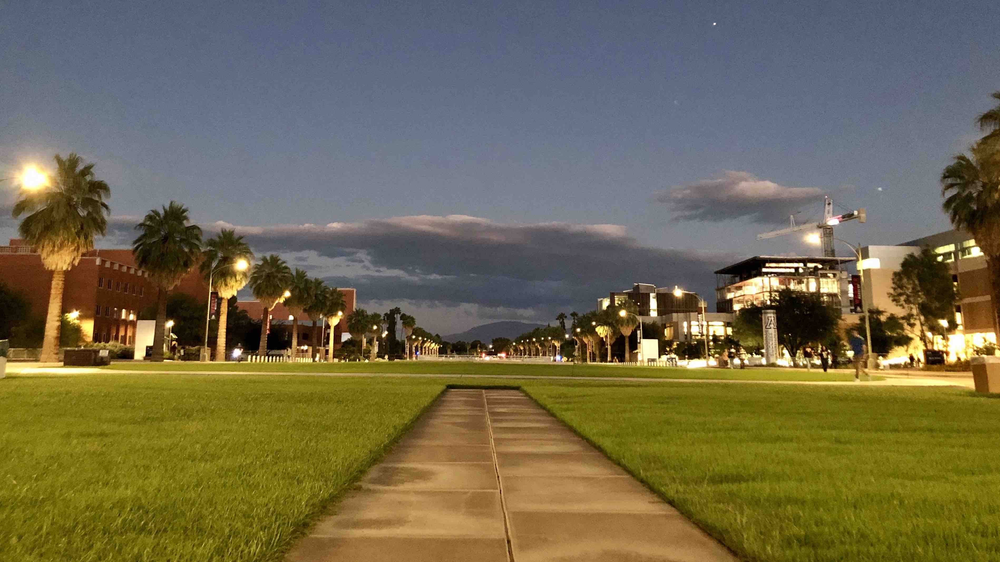

In [230]:
import cv2
from google.colab.patches import cv2_imshow
!wget https://user-images.githubusercontent.com/98360062/265904262-a9a99ac0-777f-4072-ba84-326e92f92a10.jpg
plop=cv2.imread('265904262-a9a99ac0-777f-4072-ba84-326e92f92a10.jpg')
cv2_imshow(plop)

We can apply the wavelet transform to different color planes of an RGB image. Let's do just the blue plane:

--2023-09-06 05:55:46--  https://user-images.githubusercontent.com/98360062/265906475-96940ffe-517b-4871-b1ec-232a095971bb.png
Resolving user-images.githubusercontent.com (user-images.githubusercontent.com)... 185.199.110.133, 185.199.109.133, 185.199.108.133, ...
Connecting to user-images.githubusercontent.com (user-images.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2995193 (2.9M) [image/png]
Saving to: ‘265906475-96940ffe-517b-4871-b1ec-232a095971bb.png.1’

265906475-96940ffe- 100%[===================>]   2.86M  12.0MB/s    in 0.2s    

2023-09-06 05:55:46 (12.0 MB/s) - ‘265906475-96940ffe-517b-4871-b1ec-232a095971bb.png.1’ saved [2995193/2995193]



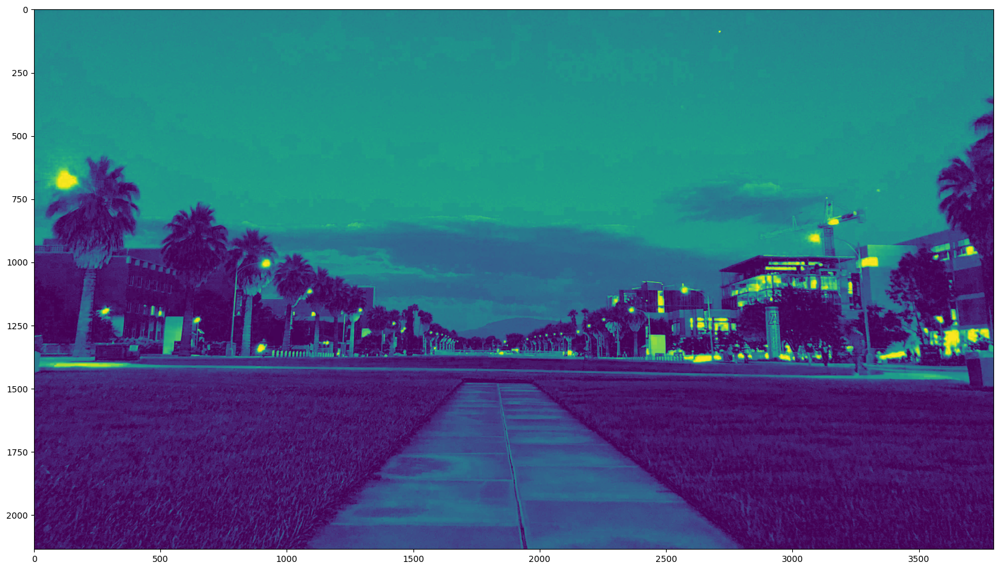

In [225]:
!wget https://user-images.githubusercontent.com/98360062/265906475-96940ffe-517b-4871-b1ec-232a095971bb.png
blue=io.imread('265906475-96940ffe-517b-4871-b1ec-232a095971bb.png',as_gray=True)
np.shape(blue)
plt.imshow(blue)

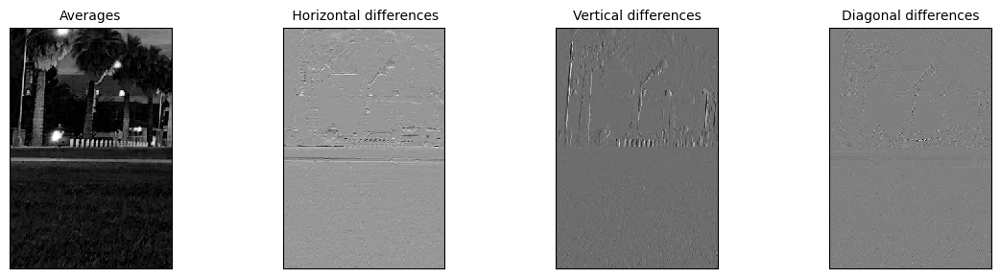

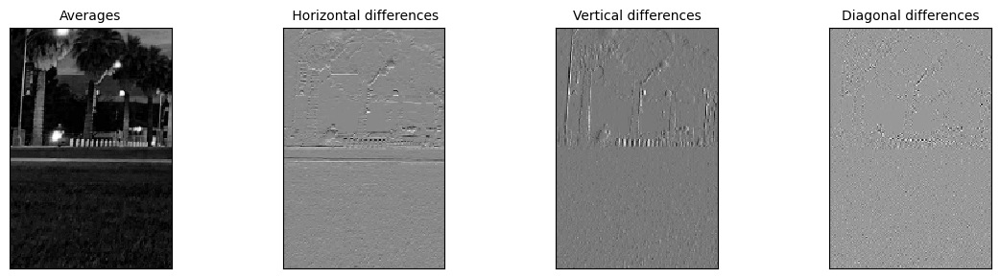

In [228]:
titles = ['Averages', ' Horizontal differences',
          'Vertical differences', 'Diagonal differences']
coeffs2 = pywt.dwt2(blue[1000:1760,750:1262], 'haar')
LL, (LH, HL, HH) = coeffs2
fig = plt.figure(figsize=(12, 3))
for i, a in enumerate([LL, LH, HL, HH]):
    ax = fig.add_subplot(1, 4, i + 1)
    ax.imshow(a, interpolation="nearest", cmap=plt.cm.gray)
    ax.set_title(titles[i], fontsize=10)
    ax.set_xticks([])
    ax.set_yticks([])
fig.tight_layout()
fig.show()

titles = ['Averages', ' Horizontal differences',
          'Vertical differences', 'Diagonal differences']
coeffs2 = pywt.dwt2(LL, 'haar')
LL, (LH, HL, HH) = coeffs2
fig = plt.figure(figsize=(12, 3))
for i, a in enumerate([LL, LH, HL, HH]):
    ax = fig.add_subplot(1, 4, i + 1)
    ax.imshow(a, interpolation="nearest", cmap=plt.cm.gray)
    ax.set_title(titles[i], fontsize=10)
    ax.set_xticks([])
    ax.set_yticks([])
fig.tight_layout()
fig.show()

# Discrete Forward Models

<ipython-input-140-239a8642751e>:3: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  N=np.int(2*X/samplingRate)


Text(0.5, 1.0, '$|{\\hat f}(u)|$')

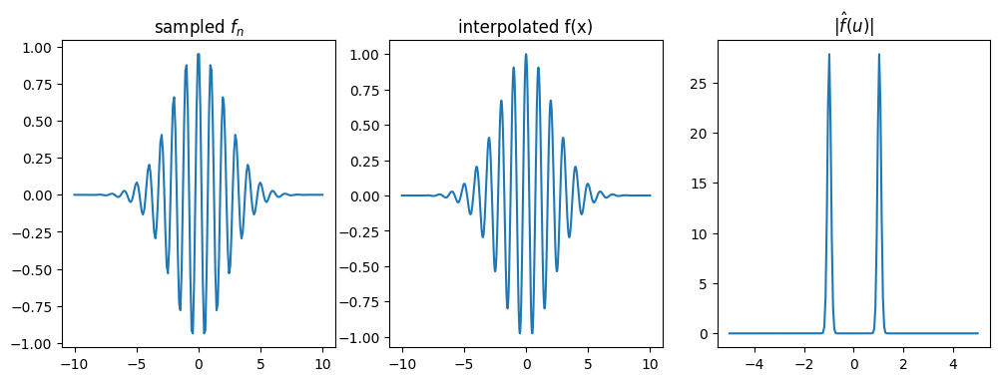

In [140]:
X=10
samplingRate=.1
N=np.int(2*X/samplingRate)
B=N/(4*X)
xrange=np.linspace(-X,X,N)
urange=np.linspace(-B,B,N)
def f(x):
  f=np.cos(2*np.pi*x)*np.exp(-x**2/10)
  return f
# now let's make interpolated function
fUp= InterpolatedUnivariateSpline(xrange,f(xrange), k=5)
plt.figure(figsize=(12, 4))
plt.subplot(1,3,1)
plt.plot(xrange,f(xrange))
plt.title('sampled $f_n$')
plt.subplot(1,3,2)
xUpSample=np.linspace(-X,X,8*N)
plt.plot(xUpSample,fUp(xUpSample))
plt.title('interpolated f(x)')
plt.subplot(1,3,3)
plt.plot(urange,np.abs(np.fft.fftshift(np.fft.fft(f(xrange)))))
plt.title('$|{\hat f}(u)|$')

*Figure 2.18: Sample data, interpolated signal and Fourier magnitude for $f(x) = cos(2 \pi x)e^{-\frac{x^2}{10}}$ sampled with period 0.1. The Nyquist sampling period for this signal is approximately 0.5, so this rate is approximately 5 x Nyquist. Interpolation is implemented using the 5th order B-spline.*


<ipython-input-141-e6465555a00b>:3: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  N=np.int(2*X/samplingRate)


Text(0.5, 1.0, '$|{\\hat f}(u)|$')

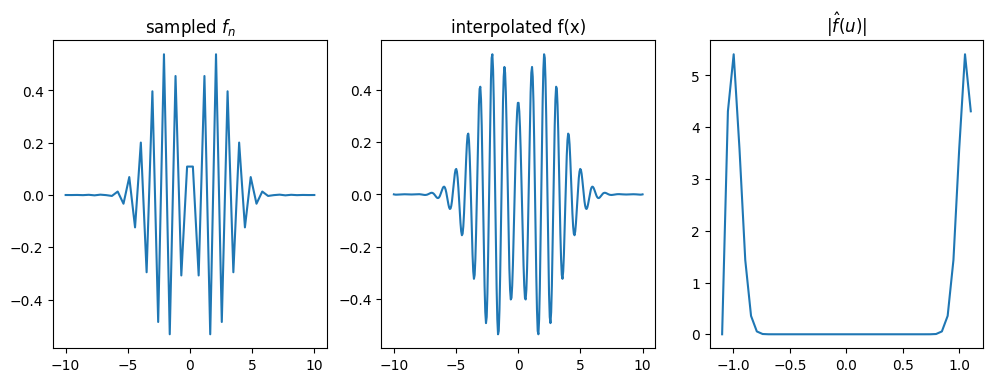

In [141]:
X=10
samplingRate=.5/1.1
N=np.int(2*X/samplingRate)
B=N/(4*X)
xrange=np.linspace(-X,X,N)
urange=np.linspace(-B,B,N)
def f(x):
  f=np.cos(2*np.pi*x)*np.exp(-x**2/10)
  return f
# now let's make interpolated function
fUp= InterpolatedUnivariateSpline(xrange,f(xrange), k=5)
plt.figure(figsize=(12, 4))
plt.subplot(1,3,1)
plt.plot(xrange,f(xrange))
plt.title('sampled $f_n$')
plt.subplot(1,3,2)
xUpSample=np.linspace(-X,X,8*N)
plt.plot(xUpSample,fUp(xUpSample))
plt.title('interpolated f(x)')
plt.subplot(1,3,3)
plt.plot(urange,np.abs(np.fft.fftshift(np.fft.fft(f(xrange)))))
plt.title('$|{\hat f}(u)|$')

*Figure 2.19: Sample data, interpolated signal and Fourier magnitude for $f(x) = cos(2 \pi x)e^{-\frac{x^2}{10}}$ sampled with period 0.45.*

<ipython-input-142-87bc18c13df7>:3: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  N=np.int(2*X/samplingRate)


Text(0.5, 1.0, '$|{\\hat f}(u)|$')

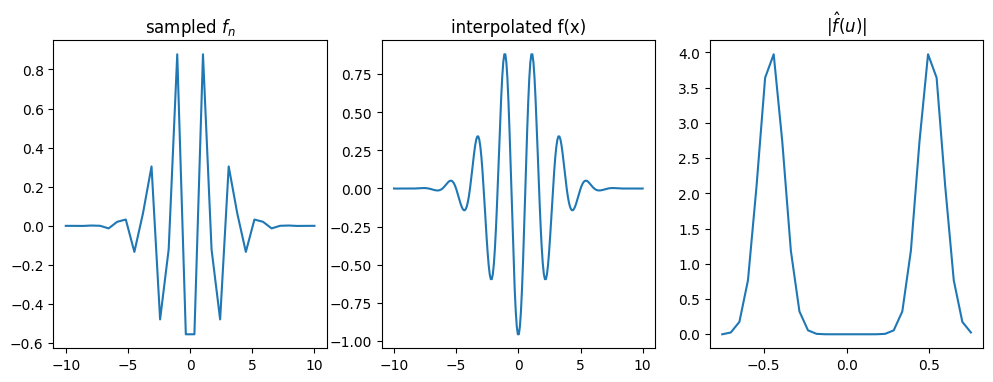

In [142]:
X=10
samplingRate=.5*1.3
N=np.int(2*X/samplingRate)
B=N/(4*X)
xrange=np.linspace(-X,X,N)
urange=np.linspace(-B,B,N)
def f(x):
  f=np.cos(2*np.pi*x)*np.exp(-x**2/10)
  return f
# now let's make interpolated function
fUp= InterpolatedUnivariateSpline(xrange,f(xrange), k=5)
plt.figure(figsize=(12, 4))
plt.subplot(1,3,1)
plt.plot(xrange,f(xrange))
plt.title('sampled $f_n$')
plt.subplot(1,3,2)
xUpSample=np.linspace(-X,X,8*N)
plt.plot(xUpSample,fUp(xUpSample))
plt.title('interpolated f(x)')
plt.subplot(1,3,3)
plt.plot(urange,np.abs(np.fft.fftshift(np.fft.fft(f(xrange)))))
plt.title('$|{\hat f}(u)|$')

*Figure 2.20: Sample data, interpolated signal and Fourier magnitude for $f(x) = cos(2 \pi x)e^{-\frac{x^2}{10}}$ sampled with period 0.65. Signal is undersampled and appears to oscillate at a lower frequency.*

<ipython-input-143-64811f06416e>:6: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  N=np.int(2*X/delta)


Text(0.5, 1.0, '$|{\\hat g}(u)|$')

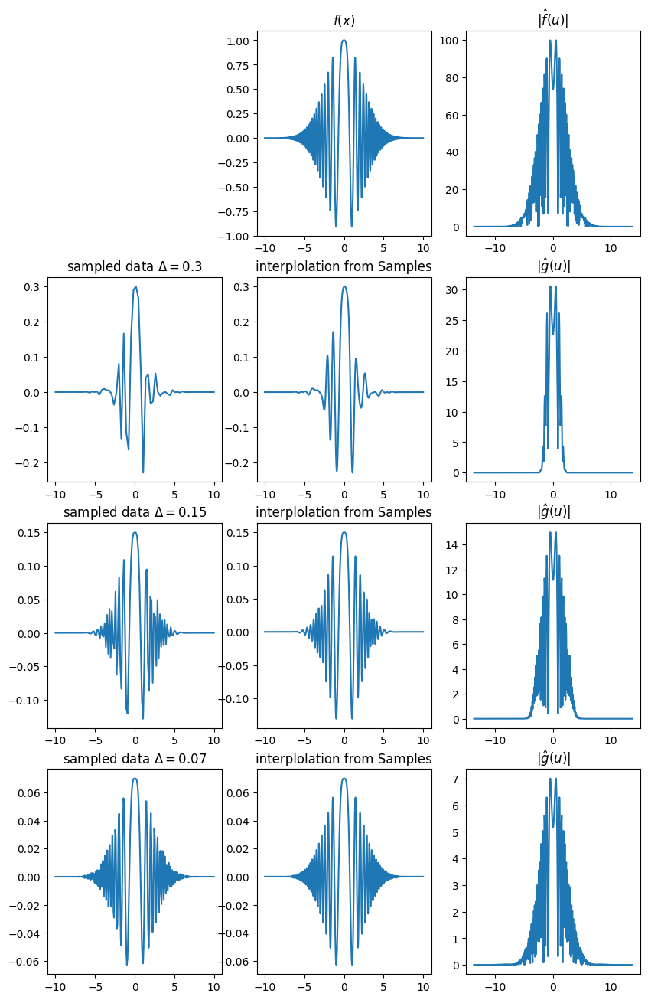

In [143]:
X=10
def f(x):
  f=np.cos(2*np.pi*(x**2/2))*np.exp(-x**2/10)
  return f
def gn(delta=1):
  N=np.int(2*X/delta)
  gg=np.zeros(N)
  for pop in np.arange(len(gg)):
    gg[pop]=integrate.quad(f,(-X+pop*delta),(-X+(pop+1)*delta))[0]
  return gg
plt.rcParams['figure.figsize'] = [20, 50]
X=10
xrange=np.linspace(-X,X,2048)
urange=np.linspace(-2048/(4*X),2048/(4*X),2048)
plt.figure(figsize=(10,16))
plt.subplot(4,3,2)
plt.plot(xrange,f(xrange))
plt.title('$f(x)$')
plt.subplot(4,3,3)
plt.plot(urange[750:1300],np.abs(np.fft.fftshift(np.fft.fft(f(xrange))))[750:1300])
plt.title('$|{\hat f}(u)|$')
plt.subplot(4,3,4)
gN=gn(.3)
plt.plot(np.linspace(-X,X,len(gN)),gN)
plt.title('sampled data $\Delta=0.3$')
gUp= InterpolatedUnivariateSpline(np.linspace(-X,X,len(gN)),gN, k=5)
plt.subplot(4,3,5)
plt.plot(xrange,gUp(xrange))
plt.title('interplolation from Samples')
plt.subplot(4,3,6)
plt.plot(urange[750:1300],np.abs(np.fft.fftshift(np.fft.fft(gUp(xrange))))[750:1300])
plt.title('$|{\hat g}(u)|$')
plt.subplot(4,3,7)
gN=gn(.15)
plt.plot(np.linspace(-X,X,len(gN)),gN)
plt.title('sampled data $\Delta=0.15$')
gUp= InterpolatedUnivariateSpline(np.linspace(-X,X,len(gN)),gN, k=5)
plt.subplot(4,3,8)
plt.plot(xrange,gUp(xrange))
plt.title('interplolation from Samples')
plt.subplot(4,3,9)
plt.plot(urange[750:1300],np.abs(np.fft.fftshift(np.fft.fft(gUp(xrange))))[750:1300])
plt.title('$|{\hat g}(u)|$')
plt.subplot(4,3,10)
gN=gn(.07)
plt.plot(np.linspace(-X,X,len(gN)),gN)
plt.title('sampled data $\Delta=0.07$')
gUp= InterpolatedUnivariateSpline(np.linspace(-X,X,len(gN)),gN, k=5)
plt.subplot(4,3,11)
plt.plot(xrange,gUp(xrange))
plt.title('interplolation from Samples')
plt.subplot(4,3,12)
plt.plot(urange[750:1300],np.abs(np.fft.fftshift(np.fft.fft(gUp(xrange))))[750:1300])
plt.title('$|{\hat g}(u)|$')

*Figure 2.21: Sample data, interpolated signal and Fourier magnitude for $f(x) = cos(2 \pi x)e^{-\frac{x^2}{10}}$ for various sampling periods*

If our sampling frequency is too low, we collapse to a lower frequency than that of the original signal. This is aliasing, and it means with our samples, we will not be able to recreate the original signal. By undersampling, we are essentially applying a low pass filter on the original signal.

# Singular Value Spectra for Various Forward Models

The grayscale singular value spectra figures we see below are essentially the frequencies put in order from low to high frequencies, going from the top of the figure to the bottom.

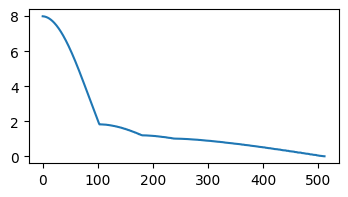

In [144]:
from scipy.linalg import toeplitz
psf=[1,1,1,1,1,1,1,1]
N=512
firstRow=np.concatenate((psf,np.zeros(N-len(psf))))
firstColumn=np.zeros(N)
firstColumn[0]=1
H=toeplitz(firstColumn,firstRow)
u, s, vh=np.linalg.svd(H)
plt.figure(figsize=(4,2))
plt.plot(s)

*Figure 2.22: Singular values for measurement with the 8x down sampling psf 11111111 on a 512 pixel space*

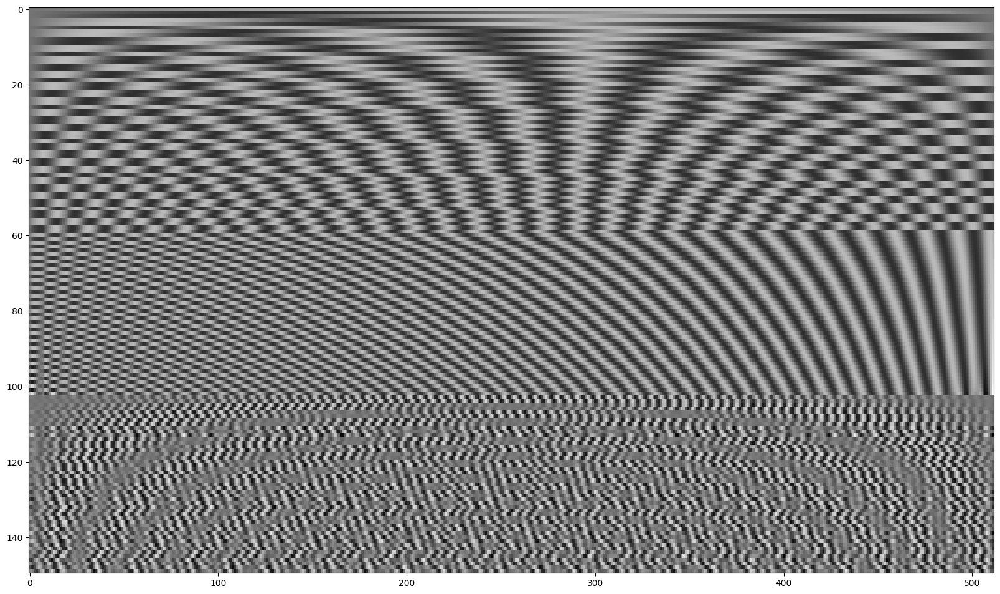

In [145]:
plt.imshow(vh[0:150,:],cmap='gray', aspect = 2)

*Figure 2.23: Lowest 128 order singular vectors for measurement with the 8x down sampling psf 11111111 on a 512 pixel space*

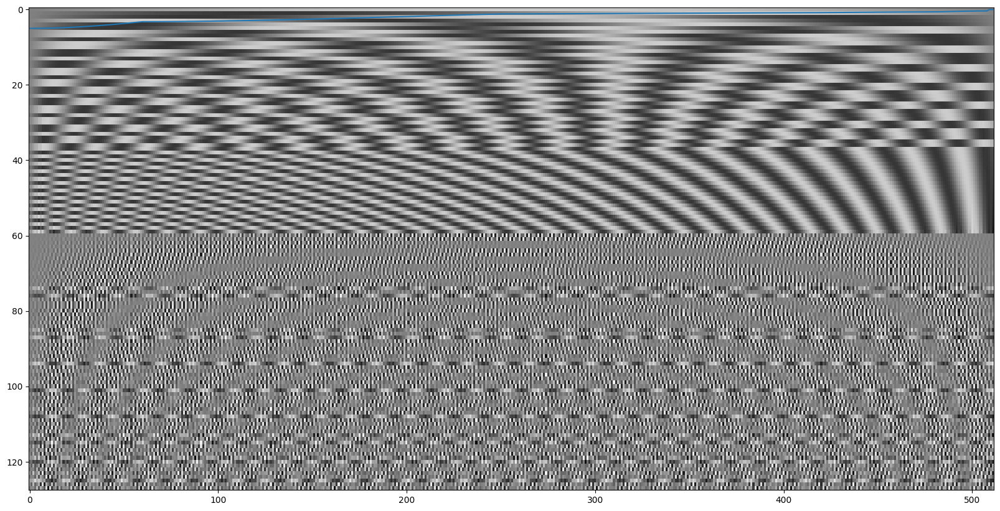

In [146]:
from scipy.linalg import toeplitz
psf=[1,0,1,1,0,1,0,1]
N=512
firstRow=np.concatenate((psf,np.zeros(N-len(psf))))
firstColumn=np.zeros(N)
firstColumn[0]=1
H=toeplitz(firstColumn,firstRow)
u, s, vh=np.linalg.svd(H)
plt.plot(s)
plt.imshow(vh[0:128,:],cmap='gray', aspect = 2)

*Figure 2.24: Lowest 128 order singular vectors for measurement with shift invariant psf 10110101 on a 512 pixel space.*

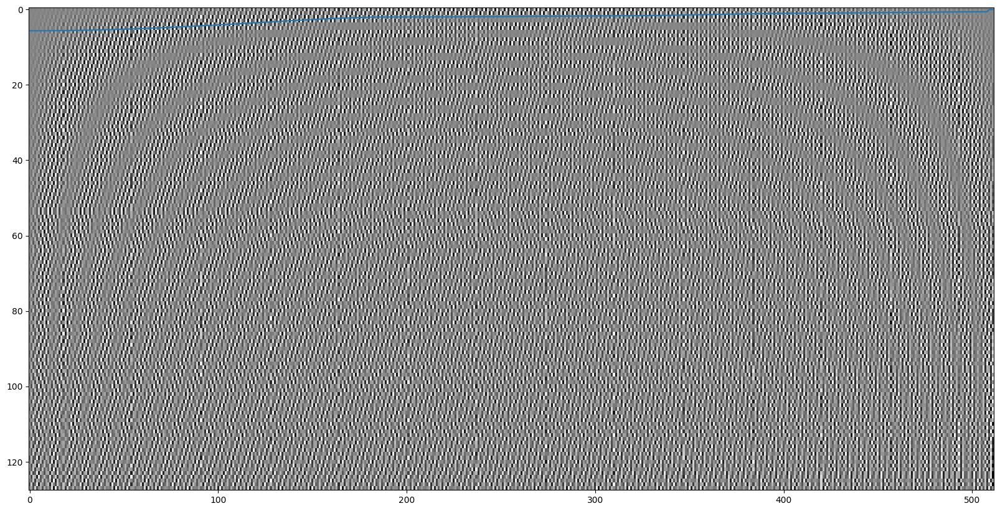

In [147]:
from scipy.linalg import toeplitz
psf=[1,-1,1,1,-1,1,-1,1]
N=512
firstRow=np.concatenate((psf,np.zeros(N-len(psf))))
firstColumn=np.zeros(N)
firstColumn[0]=1
H=toeplitz(firstColumn,firstRow)
u, s, vh=np.linalg.svd(H)
plt.plot(s)
plt.imshow(vh[0:128,:],cmap='gray', aspect = 2)

*Figure 2.25: Lowest 128 order singular vectors for measurement with bipolar psf 1 -1 1 -1 1 -1 1 on a 512 pixel space.*


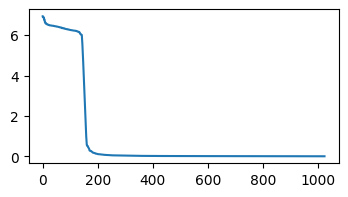

In [148]:
from scipy.linalg import toeplitz
psf=np.sinc(np.linspace(-10,10,128))
N=1024
firstRow=np.concatenate((psf,np.zeros(N-len(psf))))
firstColumn=np.zeros(N)
firstColumn[0]=firstRow[0]
H=toeplitz(firstColumn,firstRow)
u, s, vh=np.linalg.svd(H)
plt.figure(figsize=(4,2))
plt.plot(s)

*Figure 2.26: Singular value spectrum for PSF $sinc(x)$ on a 512 pixel space*

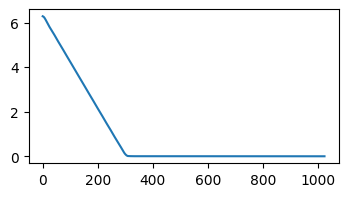

In [149]:
from scipy.linalg import toeplitz
psf=np.abs(np.sinc(np.linspace(-10,10,128)))**2
N=1024
firstRow=np.concatenate((psf,np.zeros(N-len(psf))))
firstColumn=np.zeros(N)
firstColumn[0]=firstRow[0]
H=toeplitz(firstColumn,firstRow)
u, s, vh=np.linalg.svd(H)
plt.figure(figsize=(4,2))
plt.plot(s)

*Figure 2.27: Singular value spectrum for PSF $sinc^2(x)$ on a 512 pixel space*

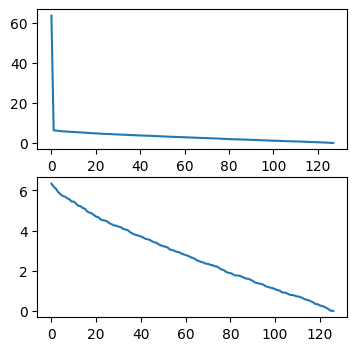

In [150]:
from scipy.linalg import toeplitz
H=np.random.random((128,128))
u, s, vh=np.linalg.svd(H)
plt.figure(figsize=(4,4))
plt.subplot(2,1,1)
plt.plot(s)
plt.subplot(2,1,2)
plt.plot(s[1:])

*Figure 2.28: Singular value spectrum for a unipolar 128x128 random sampling matrix H*